In [1]:
%%HTML
<style>
    /* style for presentation only */
    .reveal .rendered_html table { font-size: 24px }
    /* centre images */
    .reveal .rendered_html img {
        display: table-cell;
        text-align: center;
        vertical-align: middle;
        horizontal-align: middle;
        margin-left: auto;
        margin-right: auto;
    }
</style> 

# Dask: Practical Distributed Computing for "Big" Data

Andrew Bolster 
* [bolster.online](https://bolster.online)
* Tweets [@bolster](https://twitter.bolster.online)
* GitHubs at [andrewbolster](https://github.com/andrewbolster)
* Works at [AlertLogic](https://alertlogic.com) **We're hiring Threat/Exploit Researchers**
* Plays at [Farset Labs](https://www.farsetlabs.org.uk)
* **[THIS NOTEBOOK IS AT present.bolster.online](http://present.bolster.online)**
* [Also available in source at presentgh.bolster.online](http://presentgh.bolster.online)

## Disclaimers

* Some of this example data is real, 
* some of it is anonymised, 
* I'm more interested in convenience than absolute speed so don't tell me "it's faster in Rust"... Looking at you @sigma
* My definition of "Big" is "Causes Out Of Memory Errors Trying To Do In Place Operations. YMMV

# Requirements.txt (Conda; you're using conda right?)

* dask
* dask-ml
* pandas
* numpy
* sklearn
* graphviz
* python-graphviz

# Dask

> Dask natively scales Python

> Dask provides advanced parallelism for analytics, enabling performance at scale for the tools you love

Sits upon/Extends *the* 3 massive pillars of Pythons Data Ecosystem

* Numpy
* Pandas
* Scikit-learn

Also roughly maps to their respective API's

# But First: What's the point?

![](collections-schedulers.png)

* Lazily evaluated task graph computing but it looks like normal
* Can be run without any additional setup
* Threaded/async/MP paradigm out of the box
* *Can* be connected to a distributed client

> "Scales from Laptop to Cluster"

## My Setup:

* Local Jupyter Notebook Server
* [Remote Azure backed Kubernetes Service w/8 workers](http://docs.dask.org/en/latest/setup/kubernetes-helm.html)

# API Rundowns

In [1]:
from dask.distributed import Client
# Don't mine bitcoin... 
client = Client("dask.azure.farsetlabs.org.uk:8786")
client

Client Scheduler: tcp://dask.azure.farsetlabs.org.uk:8786 Dashboard: http://dask.azure.farsetlabs.org.uk:8787/status,Cluster Workers: 7 Cores: 14 Memory: 58.56 GB


In [132]:
def inc(x):
    return x + 1

def double(x):
    return x * 2

def add(x, y):
    return x + y

In [133]:
data = [1, 2, 3, 4, 5]

output = []
for x in data:
    a = inc(x)
    b = double(x)
    c = add(a, b)
    output.append(c)

total = sum(output)

total

50

In [134]:
from dask import delayed

output = []
for x in data:
    a = delayed(inc)(x)
    b = delayed(double)(x)
    c = delayed(add)(a, b)
    output.append(c)
    
total = delayed(sum)(output)

total

Delayed('sum-ea922d3e-3b23-4440-8720-383b7aca52d2')

In [135]:
total.compute()

50

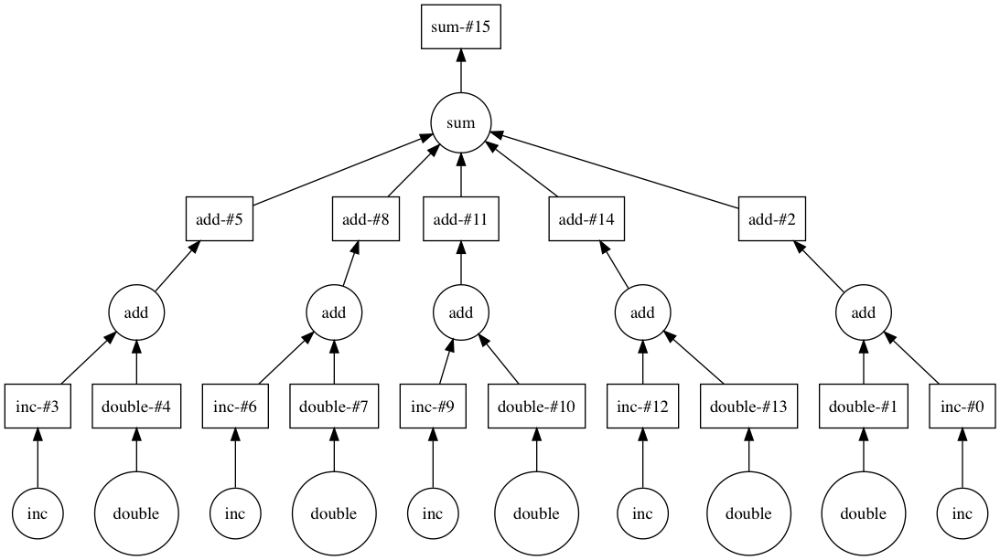

In [7]:
total.visualize()

In [235]:
output = []
# EMBIGGEN
for x in range(100,10000):
    a = delayed(inc)(x)
    b = delayed(double)(x)
    c = delayed(add)(a, b)
    output.append(c)
    
total = delayed(sum)(output)

total.visualise() # JK lol even visualizing this is expensive bro

Delayed('visualise-9149ad46-1e9f-49c4-834e-59de1347ba41')

[Status Page](http://dask.azure.farsetlabs.org.uk/status)

In [236]:
total.compute()

TypeError: can only concatenate tuple (not "int") to tuple

This is largely pointless from a performance perspective; most CPU time going to tiny data transfers between nodes. So do something more interesting than this with it

## Numpy-ish

In [10]:
import numpy as np

np_x = np.random.random(size=(5,5))
np_x

array([[0.29000585, 0.30788317, 0.86979735, 0.86300755, 0.65714256],
       [0.16837351, 0.21819899, 0.7657881 , 0.87021234, 0.73901226],
       [0.91847809, 0.84093942, 0.68393685, 0.29915643, 0.04555377],
       [0.92068636, 0.10890062, 0.38525213, 0.92745055, 0.45305496],
       [0.44330573, 0.87326563, 0.61401039, 0.12142642, 0.3499154 ]])

In [11]:
np_x + np_x.T - np_x.mean(axis=0)

array([[ 0.0318418 ,  0.00641912,  1.12451847,  1.16744325,  0.65151249],
       [-0.07191322, -0.03343958,  0.94297056,  0.36286231,  1.1633421 ],
       [ 1.24010552,  1.13688995,  0.70411674,  0.0681579 ,  0.21062837],
       [ 1.235524  ,  0.5092754 ,  0.0206516 ,  1.23865044,  0.12554559],
       [ 0.55227837,  1.14244032, -0.00419281, -0.04176928,  0.25089501]])

In [12]:
# np_x = np.random.random(size=(10000,10000))
# result = np_x + np_x.T - np_x.mean(axis=0)
## This takes >> 5 seconds, CBA

In [140]:
import dask.array as da
da_x = da.random.random(size=(10000, 10000),
                     chunks=(1000, 1000))
da_x # WTH is this? I mean, it's descriptive but...

dask.array<random_sample, shape=(10000, 10000), dtype=float64, chunksize=(1000, 1000)>

In [14]:
da_x[:5,:5] # Ok, seriously, where's my numbers?

dask.array<getitem, shape=(5, 5), dtype=float64, chunksize=(5, 5)>

In [15]:
da_x[:5,:5].compute() # lazy evaluation of data

array([[0.075723  , 0.39635365, 0.53712974, 0.56591603, 0.88094642],
       [0.09801822, 0.12207106, 0.03683316, 0.46230525, 0.23279154],
       [0.7545325 , 0.43110609, 0.52937419, 0.25715095, 0.22381576],
       [0.75288541, 0.86635459, 0.29301607, 0.29877101, 0.8373416 ],
       [0.0833988 , 0.40806595, 0.78905012, 0.33962704, 0.15029743]])

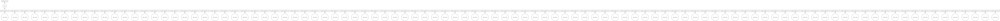

In [16]:
da_x[:5,:5].visualize()

In [17]:
op = da_x + da_x.T - da_x.mean(axis=0)
op.visualize() 

In [141]:
op[:5,:5].compute()

array([[-0.34977012, -0.00880446,  0.79188949,  0.81678444,  0.46048906],
       [-0.00684425, -0.25903421, -0.03183349,  0.82664284,  0.13700131],
       [ 0.79044612, -0.03523707,  0.55897563,  0.04815003,  0.50900972],
       [ 0.81758532,  0.82548351,  0.05039428,  0.09552502,  0.67311247],
       [ 0.46312911,  0.13768116,  0.51309314,  0.67495164, -0.2032613 ]])

## Pandas-ish

In [237]:
import pandas as pd
df = pd.read_parquet("s3://datasets.farsetlabs.org.uk/parquet_example.parquet")
df.head()

,cid,dc,date,count,rule,sensor
0,68199976,newport,2018-09-07,6,03914540-E5A0-1004-DFBE-00000A03200B,33593
1,68199976,newport,2018-09-07,40,4B1750EF-B305-1004-EA31-00000A0006E9,33593
2,68199976,newport,2018-09-07,44,533E7ED2-B678-11DD-93EB-000C29ED5FAF,33593
3,68199976,newport,2018-09-07,30,6922B4DE-B678-11DD-9616-000C29ED5FAF,33593
4,68199976,newport,2018-09-07,24,B77C32B8-DDE8-1004-C793-00000A03200B,33593


In [238]:
df['date'] = pd.to_datetime(df['date'])

In [145]:
df.shape 

(10356232, 6)

In [22]:
df.groupby(pd.Grouper(key='date', freq='W'))['count'].sum()

date
2018-09-09    152103970373
2018-09-16    377722341283
2018-09-23    365568056966
2018-09-30    369704863173
2018-10-07    360895777706
Freq: W-SUN, Name: count, dtype: int64

In [23]:
df.groupby('rule')['count'].sum().nlargest(5)

rule
597A322F-B2F0-1004-E571-00000A0006E9    272911432045
507DD044-B678-11DD-93A7-000C29ED5FAF    139726444336
6BA78F14-A5BE-1004-F99A-00000A0006E9     99315501943
AB2A1072-5AAE-11DE-9D93-000C29DC1BD9     93021967827
E71E0938-949D-1004-D3BF-0000B86AE968     76916851651
Name: count, dtype: int64

In [239]:
from dask import dataframe
df = dataframe.read_parquet("s3://datasets.farsetlabs.org.uk/parquet_example.parquet", storage_options=dict(anon=True))
df

,cid,dc,date,count,rule,sensor
npartitions=1,,,,,,
,int64,object,object,int64,object,int64
,...,...,...,...,...,...


In [240]:
df.groupby('rule')['count'].sum().nlargest(5)

Dask Series Structure:
npartitions=1
    int64
      ...
Name: count, dtype: int64
Dask Name: series-nlargest-agg, 5 tasks

In [241]:
df.groupby('rule')['count'].sum().nlargest(5).compute()

rule
597A322F-B2F0-1004-E571-00000A0006E9    272911432045
507DD044-B678-11DD-93A7-000C29ED5FAF    139726444336
6BA78F14-A5BE-1004-F99A-00000A0006E9     99315501943
AB2A1072-5AAE-11DE-9D93-000C29DC1BD9     93021967827
E71E0938-949D-1004-D3BF-0000B86AE968     76916851651
Name: count, dtype: int64

This is fairly pointless, as the data is not partitioned, so the *data* isn't distributed automatically. All runs on one core on one node.

Can either repartition in-place, or...

Distribute the data across 100 partitions in S3

In [3]:
from dask import dataframe

df = dataframe.read_parquet("s3://datasets.farsetlabs.org.uk/parquet_dask_example/", storage_options=dict(anon=True))
df = client.persist(df) # Runs Above and updates state
df

,cid,dc,date,count,rule,sensor
npartitions=100,,,,,,
,int64,object,object,int64,object,int64
,...,...,...,...,...,...
...,...,...,...,...,...,...
,...,...,...,...,...,...
,...,...,...,...,...,...


In [4]:
# From around 10s on 1 partition to ~1s (inc network)
df.groupby('rule')['count'].sum().nlargest(5).compute()

rule
597A322F-B2F0-1004-E571-00000A0006E9    272911432045
507DD044-B678-11DD-93A7-000C29ED5FAF    139726444336
6BA78F14-A5BE-1004-F99A-00000A0006E9     99315501943
AB2A1072-5AAE-11DE-9D93-000C29DC1BD9     93021967827
E71E0938-949D-1004-D3BF-0000B86AE968     76916851651
Name: count, dtype: int64

In [5]:
# Lazy evaluation of operations
daily_rulesum = df.groupby(['date','rule'])['count'].sum()
daily_cidsum = df.groupby(['date','cid'])['count'].sum()
daily_rulesum

Dask Series Structure:
npartitions=1
    int64
      ...
Name: count, dtype: int64
Dask Name: series-groupby-sum-agg, 216 tasks

In [159]:
daily_cidsum.visualize()

In [6]:
daily_cidsum.compute().unstack('cid').head()

cid,31,93,107,117,144,330,459,488,620,837,...,134281705,134281768,134281796,134282006,134282543,134282612,134282768,134282936,134282997,134283210
date,,,,,,,,,,,,,,,,,,,,,
2018-09-07,201933.0,5517386.0,99309.0,2051.0,531445.0,8430529.0,14796073.0,353257989.0,43324110.0,45107312.0,...,NaN,13806.0,10388.0,1808326.0,598353.0,NaN,3277.0,79464177.0,1022440.0,3702169.0
2018-09-08,161447.0,5527700.0,64268.0,2032.0,413635.0,8238449.0,14663588.0,300355982.0,33834277.0,41750626.0,...,NaN,14087.0,9034.0,1285840.0,503374.0,NaN,3281.0,58983430.0,1016571.0,3476031.0
2018-09-09,161620.0,5115281.0,50711.0,1938.0,414650.0,8435564.0,14655743.0,280644659.0,32638281.0,39835099.0,...,NaN,13617.0,10957.0,1094370.0,567626.0,NaN,3325.0,58938424.0,1016826.0,3636011.0
2018-09-10,197397.0,5307301.0,11971.0,2019.0,424714.0,8615849.0,14796995.0,348384144.0,44208178.0,46487912.0,...,NaN,13671.0,11374.0,1659566.0,535827.0,NaN,3302.0,83782838.0,1024556.0,3767696.0
2018-09-11,190772.0,5494269.0,55266.0,2080.0,431670.0,8593415.0,14817655.0,360297456.0,46417327.0,47966366.0,...,4153.0,13826.0,11680.0,1683092.0,527060.0,NaN,3307.0,87438530.0,1034831.0,3863547.0


In [7]:
top_5_rules_each_day = df.groupby(['date','rule'])['count'].sum().reset_index()\
    .groupby('date').apply(lambda grp:grp.nlargest(5, 'count')).reset_index(drop=True)

/Users/andrew.bolster/anaconda3/envs/dask_demo/lib/python3.6/site-packages/ipykernel/__main__.py:2: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  from ipykernel import kernelapp as app


In [162]:
top_5_rules_each_day.visualize()

In [8]:
top_5_rules_each_day.compute().head(100)

,date,rule,count
0,2018-09-07,597A322F-B2F0-1004-E571-00000A0006E9,9028411118
1,2018-09-07,507DD044-B678-11DD-93A7-000C29ED5FAF,4442675669
2,2018-09-07,6BA78F14-A5BE-1004-F99A-00000A0006E9,3248994921
3,2018-09-07,AB2A1072-5AAE-11DE-9D93-000C29DC1BD9,3066357069
4,2018-09-07,E71E0938-949D-1004-D3BF-0000B86AE968,2451496498
5,2018-09-08,597A322F-B2F0-1004-E571-00000A0006E9,8005664972
6,2018-09-08,507DD044-B678-11DD-93A7-000C29ED5FAF,4883290089
7,2018-09-08,AB2A1072-5AAE-11DE-9D93-000C29DC1BD9,3216996816
8,2018-09-08,108B292F-B471-1004-DD86-00000A0006E9,2954862458
9,2018-09-08,6BA78F14-A5BE-1004-F99A-00000A0006E9,2810500153


## Scikit-learn-ish



In [9]:
from dask_ml.datasets import make_classification

X, y = make_classification(n_samples=100000, n_features=20,
                           chunks=1000, n_informative=4,
                           random_state=0)
X

dask.array<normal, shape=(100000, 20), dtype=float64, chunksize=(1000, 20)>

In [10]:
from dask_ml.model_selection import train_test_split
# Standard Splits, but lazily done
X_train, X_test, y_train, y_test = client.persist(train_test_split(X, y, test_size=0.15))

In [11]:
import dask.array as da
classes = da.unique(y_train).compute()
classes

array([0, 1])

In [12]:
from sklearn.linear_model import SGDClassifier

est = SGDClassifier(loss='log', penalty='l2', tol=1e-3)
est

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
       l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=None,
       n_iter=None, n_iter_no_change=5, n_jobs=None, penalty='l2',
       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
       validation_fraction=0.1, verbose=0, warm_start=False)

In [13]:
from dask_ml.wrappers import Incremental

inc = Incremental(est, scoring='accuracy')
inc

Incremental(estimator=SGDClassifier(alpha=0.0001, average=False, class_weight=None,
       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
       l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=None,
       n_iter=None, n_iter_no_change=5, n_jobs=None, penalty='l2',
       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
       validation_fraction=0.1, verbose=0, warm_start=False),
      random_state=None, scoring='accuracy', shuffle_blocks=True)

In [14]:
inc.fit(X_train, y_train, classes=classes)

Incremental(estimator=SGDClassifier(alpha=0.0001, average=False, class_weight=None,
       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
       l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=None,
       n_iter=None, n_iter_no_change=5, n_jobs=None, penalty='l2',
       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
       validation_fraction=0.1, verbose=0, warm_start=False),
      random_state=None, scoring='accuracy', shuffle_blocks=True)

In [15]:
inc.score(X_test, y_test)

0.6731333333333334

In [16]:
est = SGDClassifier(loss='log', penalty='l2', tol=0e-3)
inc = Incremental(est, scoring='accuracy')

for _ in range(10):
    inc.partial_fit(X_train, y_train, classes=classes)
    print('Score:', inc.score(X_test, y_test))

Score: 0.6832
Score: 0.6918666666666666
Score: 0.706
Score: 0.6896
Score: 0.7096
Score: 0.7116
Score: 0.7172666666666667
Score: 0.7117333333333333
Score: 0.7178666666666667
Score: 0.7082


distributed.batched - INFO - Batched Comm Closed: in <closed TCP>: OSError: [Errno 49] Can't assign requested address
distributed.batched - INFO - Batched Comm Closed: in <closed TCP>: OSError: [Errno 49] Can't assign requested address


In [232]:
inc.predict(X_test)

dask.array<predict, shape=(15000,), dtype=int64, chunksize=(150,)>

In [233]:
inc.predict(X_test)[:100].compute()

array([0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1])

In [234]:
inc.score(X_test, y_test)

0.7118

# Semi-realistic Time Series Stationarity Analysis
This is a toy problem based on a similar workflow in AL 

Data heavily anonymised and statistically re-modeled

Count of filter triggers per 'sensor' per 'customer' per data center per day

In [256]:
from dask import dataframe
df = dataframe.read_parquet("s3://datasets.farsetlabs.org.uk/parquet_dask_example/",
                            storage_options=dict(anon=True))
df['date'] = dataframe.to_datetime(df['date'])
df = client.persist(df)
df.head()

,cid,dc,date,count,rule,sensor
0,68199976,newport,2018-09-07,6,03914540-E5A0-1004-DFBE-00000A03200B,33593
1,68199976,newport,2018-09-07,40,4B1750EF-B305-1004-EA31-00000A0006E9,33593
2,68199976,newport,2018-09-07,44,533E7ED2-B678-11DD-93EB-000C29ED5FAF,33593
3,68199976,newport,2018-09-07,30,6922B4DE-B678-11DD-9616-000C29ED5FAF,33593
4,68199976,newport,2018-09-07,24,B77C32B8-DDE8-1004-C793-00000A03200B,33593


Question:
Is trigger volume a stationary variable?

I.e. is there a trend



In [257]:
daily_sum = df.groupby('date')['count'].sum().compute()
daily_sum.head()

date
2018-09-07    52881925372
2018-09-08    51345226892
2018-09-09    47876818109
2018-09-10    55767822670
2018-09-11    55680936886
Name: count, dtype: int64

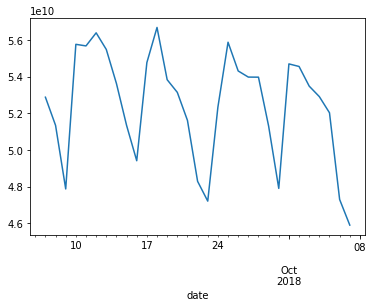

In [180]:
%matplotlib inline 
daily_sum.plot()

In [258]:
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

import pandas as pd

def test_stationarity(timeseries, window=12, plot=True, verbose=True):
    
    #Determing rolling statistics for graphing
    rolmean = timeseries.rolling(window=window,center=False).mean()
    rolstd = timeseries.rolling(window=window,center=False).std()

    if plot:
        #Plot rolling statistics:
        orig = plt.plot(timeseries, color='blue',label='Original')
        mean = plt.plot(rolmean, color='red', label='Rolling Mean')
        std = plt.plot(rolstd, color='black', label = 'Rolling Std')
        plt.legend(loc='best')
        plt.title('Rolling Mean & Standard Deviation')
        plt.show(block=False)
    
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    
    if verbose:
        #Perform Dickey-Fuller test:
        print('Results of Dickey-Fuller Test:')
        print(dfoutput)
    else:
        return dfoutput

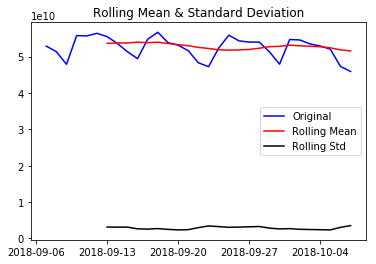

Results of Dickey-Fuller Test:
Test Statistic                 -2.253698
p-value                         0.187336
#Lags Used                      8.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64


In [259]:
test_stationarity(daily_sum, window=7)

p >> 0.05, 
-2.25 > All Critical Values

It's stationary and we're roughly 98% confident of that (within this window)

Next question; are any *customers* experiencing non-stationary changes?

In [260]:
df

,cid,dc,date,count,rule,sensor
npartitions=100,,,,,,
,int64,object,datetime64[ns],int64,object,int64
,...,...,...,...,...,...
...,...,...,...,...,...,...
,...,...,...,...,...,...
,...,...,...,...,...,...


In [262]:
def test_group_stationarity(grp):
    ts = grp.groupby('date')['count'].sum()
    if ts.shape[0]>8:
        dftest = adfuller(ts, autolag='AIC')
        dfoutput = pd.Series(dftest[0:4], 
                             index=['Test Statistic','p-value',
                                    '#Lags Used','Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        return dfoutput
    else:
        return pd.Series(index=['Test Statistic', 'p-value', '#Lags Used',
       'Number of Observations Used', 'Critical Value (1%)',
       'Critical Value (5%)', 'Critical Value (10%)'])

In [263]:
test_df = df.groupby(['cid','date'])['count'].sum()\
    .reset_index().groupby('cid').apply(
        test_group_stationarity
    ) # Takes about 30s becuase it's a long-tail task
test_df.head()

/Users/andrew.bolster/anaconda3/envs/dask_demo/lib/python3.6/site-packages/ipykernel/__main__.py:3: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  app.launch_new_instance()


,Test Statistic,p-value,#Lags Used,Number of Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%)
cid,,,,,,,
31,-2.465775,0.124025,7.0,23.0,-3.752928,-2.998500,-2.638967
93,-3.652036,0.004841,0.0,30.0,-3.669920,-2.964071,-2.621171
107,-0.000000,0.958532,8.0,6.0,-5.354256,-3.646238,-2.901198
117,-3.066437,0.029139,5.0,25.0,-3.723863,-2.986489,-2.632800
144,-5.486121,0.000002,0.0,30.0,-3.669920,-2.964071,-2.621171


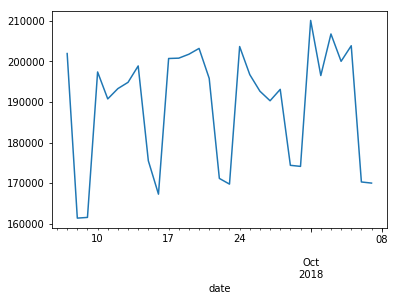

In [189]:
df[df['cid']==31].groupby('date')['count'].sum()\
    .compute().plot()

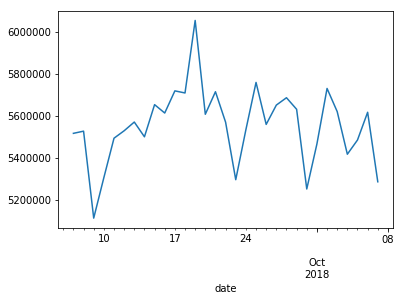

In [56]:
df[df['cid']==93].groupby('date')['count'].sum().compute().plot()

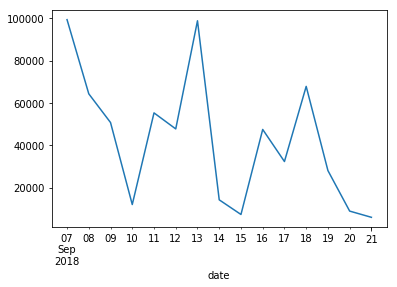

In [57]:
df[df['cid']==107].groupby('date')['count'].sum().compute().plot()

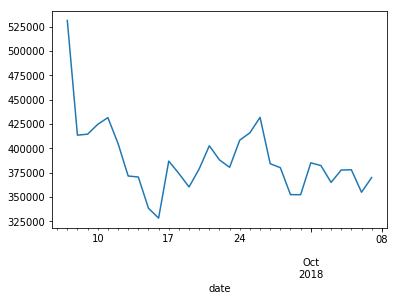

In [58]:
df[df['cid']==144].groupby('date')['count'].sum().compute().plot()

In [264]:

cid_stationarity = df.groupby(['cid','date'])['count'].sum()\
    .reset_index().groupby('cid').apply(test_group_stationarity)
    
cid_stationarity['stationary'] = cid_stationarity['p-value']<=0.05
most_stationary = cid_stationarity.nsmallest(10,'p-value')
least_stationary = cid_stationarity.nlargest(10,'p-value')

/Users/andrew.bolster/anaconda3/envs/dask_demo/lib/python3.6/site-packages/ipykernel/__main__.py:3: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  app.launch_new_instance()


In [265]:
tasks = [cid_stationarity,most_stationary,least_stationary]
meta_task = client.compute(tasks)

In [266]:
meta_task

[<Future: status: pending, key: finalize-de82b39af1a47db36cd578a534bec71a>,
 <Future: status: pending, key: finalize-f8c9223d15730ca8f9bd1d2cc82184b5>,
 <Future: status: pending, key: finalize-2feed0a234c42c3472a37110937ca67b>]

In [267]:
meta_task[0] 

<Future: status: finished, type: DataFrame, key: finalize-de82b39af1a47db36cd578a534bec71a>

In [75]:
meta_task[0]  

<Future: status: finished, type: DataFrame, key: finalize-a9a33c62fcf1d40262db224434549d7e>

In [268]:
cid_stationarity,most_stationary,least_stationary = (task.result() for task in meta_task)

In [269]:
most_stationary

,Test Statistic,p-value,#Lags Used,Number of Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),stationary
cid,,,,,,,,
36846,-19.804514,0.000000e+00,0.0,30.0,-3.669920,-2.964071,-2.621171,True
40005,-19.543684,0.000000e+00,9.0,21.0,-3.788386,-3.013098,-2.646397,True
10554204,-26.203360,0.000000e+00,0.0,26.0,-3.711212,-2.981247,-2.630095,True
68749551,-96.204732,0.000000e+00,8.0,22.0,-3.769733,-3.005426,-2.642501,True
134217777,-147.742628,0.000000e+00,9.0,21.0,-3.788386,-3.013098,-2.646397,True
134275543,-18.806057,2.022628e-30,0.0,30.0,-3.669920,-2.964071,-2.621171,True
43363,-16.773772,1.280616e-29,0.0,30.0,-3.669920,-2.964071,-2.621171,True
50124,-16.759795,1.313033e-29,0.0,30.0,-3.669920,-2.964071,-2.621171,True
10937699,-15.812664,1.042274e-28,5.0,25.0,-3.723863,-2.986489,-2.632800,True


In [270]:
most_stationary_df = df[
        df.cid.isin(most_stationary.index)
    ].groupby(['cid','date'])['count'].sum()\
    .compute().unstack('cid')

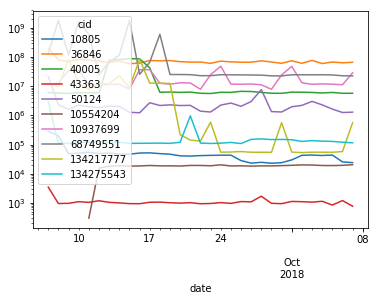

In [271]:
most_stationary_df.plot(logy=True)

In [203]:
least_stationary

,Test Statistic,p-value,#Lags Used,Number of Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),stationary
cid,,,,,,,,
11042,2.929533,1.0,6.0,24.0,-3.737709,-2.992216,-2.635747,False
12607,3.427624,1.0,8.0,22.0,-3.769733,-3.005426,-2.642501,False
15175,2.986087,1.0,6.0,24.0,-3.737709,-2.992216,-2.635747,False
16215,17.458051,1.0,5.0,25.0,-3.723863,-2.986489,-2.632800,False
27951,2.816628,1.0,8.0,22.0,-3.769733,-3.005426,-2.642501,False
28570,3.589008,1.0,5.0,25.0,-3.723863,-2.986489,-2.632800,False
29495,3.529912,1.0,9.0,21.0,-3.788386,-3.013098,-2.646397,False
36334,3.994331,1.0,6.0,24.0,-3.737709,-2.992216,-2.635747,False
38265,4.473017,1.0,6.0,24.0,-3.737709,-2.992216,-2.635747,False


In [204]:
least_stationary_df = df[
        df.cid.isin(least_stationary.index)
    ].groupby(['cid','date'])['count'].sum()\
    .compute().unstack('cid')

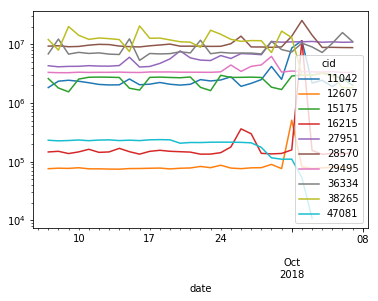

In [205]:
least_stationary_df.plot(logy=True)

In [70]:
cid_stationarity.stationary.mean()

0.3898798689479432

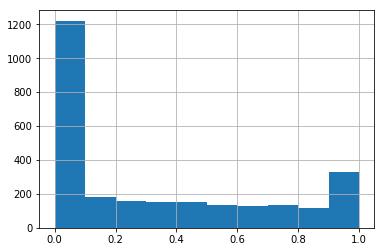

In [71]:
cid_stationarity['p-value'].hist()

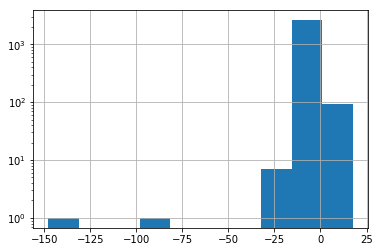

In [72]:
cid_stationarity['Test Statistic'].hist(log=True)

In [206]:
neg_tests = cid_stationarity.sort_values('Test Statistic').head()
neg_tests

,Test Statistic,p-value,#Lags Used,Number of Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),stationary
cid,,,,,,,,
134217777,-147.742628,0.0,9.0,21.0,-3.788386,-3.013098,-2.646397,True
68749551,-96.204732,0.0,8.0,22.0,-3.769733,-3.005426,-2.642501,True
10554204,-26.203360,0.0,0.0,26.0,-3.711212,-2.981247,-2.630095,True
36846,-19.804514,0.0,0.0,30.0,-3.669920,-2.964071,-2.621171,True
40005,-19.543684,0.0,9.0,21.0,-3.788386,-3.013098,-2.646397,True


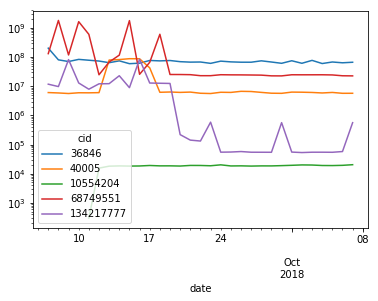

In [207]:
df[df.cid.isin(neg_tests.index)
    ].groupby(['cid','date'])['count'].sum()\
    .compute().unstack('cid').plot(logy=True)

# Wee Extras
## Cluster-side Dataset publication
Sharable between workloads and clients with lazy evaluation/moving

In [77]:
client.publish_dataset(cid_stationarity=cid_stationarity)

In [78]:
client.list_datasets()

('cid_stationarity',)

In [80]:
client.get_dataset('cid_stationarity').head()

,Test Statistic,p-value,#Lags Used,Number of Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),stationary
cid,,,,,,,,
31,-2.465775,0.124025,7.0,23.0,-3.752928,-2.998500,-2.638967,False
93,-3.652036,0.004841,0.0,30.0,-3.669920,-2.964071,-2.621171,True
107,-0.000000,0.958532,8.0,6.0,-5.354256,-3.646238,-2.901198,False
117,-3.066437,0.029139,5.0,25.0,-3.723863,-2.986489,-2.632800,True
144,-5.486121,0.000002,0.0,30.0,-3.669920,-2.964071,-2.621171,True


## Who's doing what

In [83]:
client.processing()

{'tcp://10.244.0.27:42537': (),
 'tcp://10.244.1.25:46549': (),
 'tcp://10.244.2.23:40885': (),
 'tcp://10.244.3.8:33531': (),
 'tcp://10.244.4.8:43383': (),
 'tcp://10.244.5.7:41665': (),
 'tcp://10.244.6.5:41755': ()}

## Cluster Logs

In [84]:
client.get_worker_logs()

{'tcp://10.244.0.27:42537': (('INFO',
   'distributed.worker - INFO -       Start worker at:    tcp://10.244.0.27:42537'),
  ('INFO',
   'distributed.worker - INFO -          Listening to:    tcp://10.244.0.27:42537'),
  ('INFO',
   'distributed.worker - INFO -              nanny at:          10.244.0.27:41271'),
  ('INFO',
   'distributed.worker - INFO - Waiting to connect to: tcp://donating-jaguar-dask-scheduler:8786'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO -               Threads:                          2'),
  ('INFO',
   'distributed.worker - INFO -                Memory:                    8.37 GB'),
  ('INFO',
   'distributed.worker - INFO -       Local Directory: /dask-worker-space/worker-v8i3uzlp'),
  ('INFO',
   'distributed.worker - INFO - -------------------------------------------------'),
  ('INFO',
   'distributed.worker - INFO - Waiting to connect to: tcp://donating-jagua

## Treat a Cluster like concurrent.futures

In [109]:
with client.get_executor() as exe:
    f = exe.submit(lambda i:i**i,2)
    
f.result() 

4

In [272]:
with client.get_executor() as exe:
    fs = exe.map(lambda i:i**i,range(100))
    
    print("Gone Mapping")
    
    for f in fs:
        print(len(str(f)))

Gone Mapping
1
1
1
2
3
4
5
6
8
9
11
12
13
15
17
18
20
21
23
25
27
28
30
32
34
35
37
39
41
43
45
47
49
51
53
55
57
59
61
63
65
67
69
71
73
75
77
79
81
83
85
88
90
92
94
96
98
101
103
105
107
109
112
114
116
118
121
123
125
127
130
132
134
137
139
141
143
146
148
150
153
155
157
160
162
165
167
169
172
174
176
179
181
184
186
188
191
193
196
198


distributed.batched - INFO - Batched Comm Closed: in <closed TCP>: OSError: [Errno 49] Can't assign requested address
distributed.batched - INFO - Batched Comm Closed: in <closed TCP>: OSError: [Errno 49] Can't assign requested address


## Do Async Stuffs

In [209]:
from distributed.asyncio import AioClient

async def f():
    client = await AioClient("dask.azure.farsetlabs.org.uk:8786")
    future = client.submit(lambda x: x + 1, 10)
    result = await future
    await client.close()
    return result

await f()

11

## Run things on other things
Kinda the point I guess...

In [210]:
import socket
client.run_on_scheduler(socket.gethostname)

'donating-jaguar-dask-scheduler-699c958f5f-rn6l5'

In [211]:
client.run(socket.gethostname)

{'tcp://10.244.0.27:42537': 'donating-jaguar-dask-worker-bbd789d89-wjhrk',
 'tcp://10.244.1.25:46549': 'donating-jaguar-dask-worker-bbd789d89-b6cfv',
 'tcp://10.244.2.23:40885': 'donating-jaguar-dask-worker-bbd789d89-jjgm8',
 'tcp://10.244.3.8:33531': 'donating-jaguar-dask-worker-bbd789d89-mc9lm',
 'tcp://10.244.4.8:43383': 'donating-jaguar-dask-worker-bbd789d89-66nkk',
 'tcp://10.244.5.7:41665': 'donating-jaguar-dask-worker-bbd789d89-7br49',
 'tcp://10.244.6.5:41755': 'donating-jaguar-dask-worker-bbd789d89-jjwv6'}

# Summary

* Dask is the easiest way to do clustered workloads 
* Almost identical API's to whatever workflow you're used to
* Pretty Status Board
* Makes 'embarrassingly parallel' embarrassingly easy

Feel free to try (for a few days...) dask.azure.farsetlabs.org.uk:8787

_No guarantee it'll stay up, and good luck making sure your environment works with it_

* **[THIS NOTEBOOK IS AT present.bolster.online](http://present.bolster.online)**
* [Also available in source at presentgh.bolster.online](http://presentgh.bolster.online)